In [1]:
import emcee
import corner
import speclite as speclite; from speclite import filters
from tqdm import tqdm
from matplotlib import cm
from matplotlib.artist import Artist
from chromatic import *
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from PyAstronomy import pyasl
from specutils.spectra import Spectrum1D, SpectralRegion
from specutils.fitting import fit_generic_continuum

transmission_data = np.loadtxt('../data/transmission_comp.txt')
mol_wave = transmission_data[:,0] * u.nm
mol_data = transmission_data[:,1]

In [2]:
NRES_Spectra = {
    
    "F21" : {
        
        "53" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "54" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "55" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "58" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        
        "61" : {
            "w" :None ,
            "f" : None,
            "e" : None,
        },
        
        
        "71" : {
            "w" : None,
            "f" : None,
            "e" : None,  
        },
        
        
        "76" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "77" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "81" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        
        "82" : {
            "w" : None,
            "f" : None,
            "e" : None,
        }        
      
    },
    
    "S22" : {
        
        "53" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "54" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "55" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "58" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        
        "61" : {
            "w" :None ,
            "f" : None,
            "e" : None,
        },
        
        
        "71" : {
            "w" : None,
            "f" : None,
            "e" : None,  
        },
        
        
        "76" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "77" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        "81" : {
            "w" : None,
            "f" : None,
            "e" : None,
        },
        
        
        "82" : {
            "w" : None,
            "f" : None,
            "e" : None,
        }     
      
    }
    
    
}

## Spectrum normalization functions

In [3]:
def normalize_nres(data_flux,wavelength=None,**kwargs):
    
    flux = data_flux * u.erg
    
    _m = flux/np.nanmedian(flux)
    spectrum = Spectrum1D(flux=_m, spectral_axis=wavelength)
    with warnings.catch_warnings():  # Ignore warnings
        warnings.simplefilter('ignore')
        g1_fit = fit_generic_continuum(spectrum)
        continuum_fit = g1_fit(wavelength)
        
    normed_flux = _m/continuum_fit
    
    return normed_flux

In [4]:
def normalized_1T_PHOENIX(Tspec=5000,wavelength=None,**kwargs):
        
    _model = get_phoenix_photons(temperature=float(Tspec),wavelength=wavelength,
                                 logg=4.4, metallicity=0.0)
    
    _m = _model[1]/np.nanmedian(_model[1])
    spectrum = Spectrum1D(flux=_m, spectral_axis=_model[0])
    with warnings.catch_warnings():  # Ignore warnings
        warnings.simplefilter('ignore')
        g1_fit = fit_generic_continuum(spectrum)
        continuum_fit = g1_fit(_model[0])
        
    normed_model = _m/continuum_fit
    
    return normed_model

In [5]:
def normalized_2T_PHOENIX(spot_params=[0.35,0.07,2500.,4000.],wavelength = None,
                          spotspec=None,ambspec=None, **kwargs):
    
    f_spot,df_spot,T_spot, T_amb = spot_params
    
    _m = f_spot*spotspec[1] + (1.-f_spot)*ambspec[1]
    normed_spec = _m/np.nanmedian(_m)
    spectrum = Spectrum1D(flux=normed_spec, spectral_axis=wavelength)
    with warnings.catch_warnings():  # Ignore warnings
        warnings.simplefilter('ignore')
        g1_fit = fit_generic_continuum(spectrum)
        continuum_fit = g1_fit(wavelength)
    model = normed_spec/continuum_fit
    
    return model

## Photometric variability model

In [6]:
def photometric_variability_model(parameters=None,**kwargs):
    
    f_spot,df_spot,T_spot,T_amb = parameters
    bandpass=np.linspace(3800.,10000.,400)*u.angstrom

    spotflux = get_phoenix_photons(temperature=int(T_spot), wavelength = bandpass,logg=4.4, metallicity=0.0)[1]
    ambflux = get_phoenix_photons(temperature=int(T_amb), wavelength = bandpass,logg=4.4, metallicity=0.0)[1]
    this_model_spectrum = f_spot*spotflux + (1.0-f_spot)*ambflux
                     
    d_lambda = (bandpass[1]-bandpass[0])
    contrast = 1.-(spotflux/ambflux)
    ds_over_s = -df_spot * ( contrast / ( 1.-f_spot * contrast ) )
    semi_amplitude = np.abs(ds_over_s)

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_g*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_g*d_lambda)
    modelgp = numerator/denominator

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_r*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_r*d_lambda)
    modelrp = numerator/denominator

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_i*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_i*d_lambda)
    modelip = numerator/denominator

    model = np.array([modelgp,modelrp,modelip, modelgp,modelrp])
    model_coords = [4750,6200,7550, 4750,6200]
    w_err = [500,400,500, 500,400]
    phot_data = np.array([0.075,0.074,0.05, 0.076,0.076])
    phot_errs = np.array([0.0075,0.0075,0.0075, 0.006,0.006])

    chisq = np.nansum((phot_data - model)**2./(phot_errs)**2.)
    err_weight = np.nansum(1./np.sqrt(2.*np.pi*(phot_errs)))
    ln_like = (err_weight - 0.5*chisq)
    
    return model, ln_like

In [16]:
def plot_variability_model(parameters=None,
                                  samples_exist = False,
                                  samples = None,
                                  **kwargs):
    
    f_spot,df_spot,T_spot,T_amb = parameters
    bandpass=np.linspace(3800.,10000.,400)*u.angstrom

    spotflux = get_phoenix_photons(temperature=int(T_spot), wavelength = bandpass,logg=4.4, metallicity=0.0)[1]
    ambflux = get_phoenix_photons(temperature=int(T_amb), wavelength = bandpass,logg=4.4, metallicity=0.0)[1]
    this_model_spectrum = f_spot*spotflux + (1.0-f_spot)*ambflux
                     
    d_lambda = (bandpass[1]-bandpass[0])
    contrast = 1.-(spotflux/ambflux)
    ds_over_s = -df_spot * ( contrast / ( 1.-f_spot * contrast ) )
    semi_amplitude = np.abs(ds_over_s)

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_g*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_g*d_lambda)
    modelgp = numerator/denominator

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_r*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_r*d_lambda)
    modelrp = numerator/denominator

    numerator = np.nansum(semi_amplitude*this_model_spectrum*response_i*d_lambda)
    denominator = np.nansum(this_model_spectrum*response_i*d_lambda)
    modelip = numerator/denominator
    
    model = np.array([modelgp,modelrp,modelip])
    model_coords = [4750,6200,7550]
    w_err = [500,400,500]
    phot_data = np.array([0.075,0.074,0.05])
    phot_errs = np.array([0.0075,0.0075,0.0075])
    
    fig, ax1 = plt.subplots(figsize=(8,5))
    title_label=f'Combined Photometry'
    ax1.set_title(title_label,fontsize=16,loc='left')
    ax1.set_xlabel(r'Wavelength $\AA$',fontsize=20)
    ax1.set_ylabel(r'$\frac{\Delta S(\lambda)}{S_{avg}}$',fontsize=22)
    if samples_exist:
        fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
        sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
        sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
        sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
        sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
        best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
        for k in range(0,500):
            i = np.random.randint(low=0,high=(len(Tamb_sam)-1))
            ds_spot = get_phoenix_photons(temperature=Tspot_sam[i], wavelength = bandpass,
                                                           logg=4.4, metallicity=0.0)[1]
            ds_amb = get_phoenix_photons(temperature=Tamb_sam[i], wavelength = bandpass,
                                                           logg=4.4, metallicity=0.0)[1]
            _contrast = 1.-(ds_spot/ds_amb)
            _ds_over_s = -dfspot_sam[i] * ( _contrast / ( 1.-fspot_sam[i] * _contrast ) )
            _semi_amplitude = np.abs(_ds_over_s)
            ax1.plot(bandpass, _semi_amplitude, zorder=0, alpha=0.02, color='deepskyblue')

    ax1.errorbar(model_coords,phot_data,xerr=w_err,yerr=phot_errs,color='k',label='Measured',fmt='none',zorder=1000,linewidth=3)
    ax1.set_xlim(3800,8500)
    ax1.set_ylim(0,0.11)
    ax1.legend(loc='lower right')

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
    ax2.fill_between(bandpass.value, 0, response_g/np.nanmax(response_g),color='orange',
                     zorder=-100,label='SDSS g filter response',alpha=0.3)
    ax2.fill_between(bandpass.value, 0, response_r/np.nanmax(response_r),color='teal',
                     zorder=-100,label='SDSS r filter response',alpha=0.3)
    ax2.fill_between(bandpass.value, 0, response_i/np.nanmax(response_i),color='purple',
                     zorder=-100,label='SDSS i filter response',alpha=0.3)
    ax2.set_ylabel('Filter Response',fontsize=20)
    ax2.set_ylim(0,1.1)

    ax2.legend(loc='lower left')
    
    # plt.savefig(f'../figs/{label}_photmodel.png',dpi=200)
    plt.show()

## Spectral model

In [8]:
def average_spectrum_model(parameters=[0.35,0.07,3000.,3900.],
                           data_flux=None, data_err=None,
                           wavelength=None, **kwargs):
    
    S_spot = get_phoenix_photons(temperature=int(parameters[2]),wavelength=wavelength,
                                    logg=4.4,metallicity=0.0)
    S_amb = get_phoenix_photons(temperature=int(parameters[3]),wavelength=wavelength,
                                   logg=4.4,metallicity=0.0)

    model = normalized_2T_PHOENIX(spot_params=parameters,wavelength = wavelength,
                                  spotspec=S_spot,ambspec=S_amb)
    
    chisq = np.nansum((data_flux-model)**2/(data_err**2))
    err_weight = np.nansum(1./np.sqrt(2.*np.pi*(data_err)))
    ln_like = (err_weight - 0.5*chisq)
    
    return model, ln_like

## Define the log probability

In [9]:
def lnprob(parameters=None,**kwargs):

    f_spot,df_spot,T_spot,T_amb = parameters

    if (0.0<=f_spot<=0.5) and (0.<df_spot<f_spot) and (2300.1<=T_spot<=6000.0) and (2300.1<=T_amb<=6000.0):

        ln_like=0.0
        
        "Teff likelihood"
        if do_Teff:
            Teff_model = (f_spot*(T_spot**4.) + (1.-f_spot)*(T_amb**4.))**(1./4.)    
            chisq_Teff = (3650. - Teff_model)**2./(150.)**2.
            err_weight_Teff = 1./np.sqrt(2.*np.pi*(150.))
            ln_like += (err_weight_Teff - 0.5*chisq_Teff)

            
        "Combined phot variability likelihood"
        if do_Combined_Photometry:
            ln_like += photometric_variability_model(parameters=parameters)[1]

        "Combined visit likelihood"
        if do_CombinedSpec:
            for order in good_orders:
                F21_wave = NRES_Spectra['F21'][f'{order}']['w']
                F21_spec = NRES_Spectra['F21'][f'{order}']['f']
                F21_err = NRES_Spectra['F21'][f'{order}']['e']

                S22_wave = NRES_Spectra['S22'][f'{order}']['w']
                S22_spec = NRES_Spectra['S22'][f'{order}']['f']
                S22_err = NRES_Spectra['S22'][f'{order}']['e']
                
                ln_like_F21 = average_spectrum_model(parameters=parameters, wavelength=F21_wave,
                                                       data_flux=F21_spec, data_err=F21_err)[1]
                ln_like_S22 = average_spectrum_model(parameters=parameters,wavelength=S22_wave,
                                                       data_flux=S22_spec,data_err=S22_err)[1]
                ln_like += ln_like_F21
                ln_like += ln_like_S22                

    else:
        ln_like = -np.inf

    return ln_like

## Make a wrapper for the sampler

In [10]:
def do_mcmc(label='oops you didnt label your samples :sadface:',
            nsteps=100,burnin=25,ndim=4,nwalkers=100,**kwargs):
    
    # these are initial parameters
    fspot_init = np.random.uniform(0.2, 0.45, nwalkers)
    dfspot_init = np.random.uniform(0.03, 0.1, nwalkers)
    Tspot_init = np.random.uniform(2700, 3400, nwalkers)
    Tamb_init = np.random.uniform(3700, 3900, nwalkers)
    p0 = np.transpose([fspot_init, dfspot_init, Tspot_init, Tamb_init])

    # set up file saving for the samples when finished
    filename = f"../data/samples/{label}.h5"
    backend = emcee.backends.HDFBackend(filename)
    backend.reset(nwalkers, ndim)
    # Initialize and run the sampler
    sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob, backend=backend)
    result = sampler.run_mcmc(p0, nsteps,store=True)
    samples = sampler.chain[:, burnin:, :].reshape((-1, ndim)).T

    for i in range(len(samples)):
        tau_f = emcee.autocorr.integrated_time(samples[i])
        print('(Nsteps-burnin)*nwalkers/tau=',(nsteps-burnin)*nwalkers/tau_f)
    
    return samples

## Build a dictionary of all the spectra

In [11]:
good_orders = np.array([53, 54, 55, 58, 61, 71, 76, 77, 81, 82])

for visit in tqdm(['F21','S22']):
    for order in tqdm(good_orders):
        _r = read_rainbow(f"../data/rainbows/{visit}_{order}_clipped.rainbow.npy")
        data_wave = _r.wavelength
        _1dspec = _r.get_average_spectrum()
        nres_avg_1dspec = normalize_nres(_1dspec, wavelength=data_wave)
        nres_avg_1derr = np.nanmedian(_r.uncertainty,axis=1)/np.sqrt(len(_r.timelike['time']))
        template_spec = normalized_1T_PHOENIX(temp=3600,wavelength=data_wave)
        rchisq = np.nansum((template_spec-nres_avg_1dspec)**2/(nres_avg_1derr)**2) / (len(data_wave)-1)
        if rchisq > 1.0:
            nres_avg_1derr = nres_avg_1derr * np.sqrt(rchisq)
            
        NRES_Spectra[f'{visit}'][f'{order}']['w'] = data_wave
        NRES_Spectra[f'{visit}'][f'{order}']['f'] = nres_avg_1dspec
        NRES_Spectra[f'{visit}'][f'{order}']['e'] = nres_avg_1derr

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/179 [00:00<?, ?it/s]

  0%|          | 0/176 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/143 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/182 [00:00<?, ?it/s]

  0%|          | 0/133 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

  0%|          | 0/155 [00:00<?, ?it/s]

  0%|          | 0/119 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/175 [00:00<?, ?it/s]

  0%|          | 0/198 [00:00<?, ?it/s]

  0%|          | 0/169 [00:00<?, ?it/s]

  0%|          | 0/156 [00:00<?, ?it/s]

  0%|          | 0/58 [00:00<?, ?it/s]

  0%|          | 0/189 [00:00<?, ?it/s]

  0%|          | 0/135 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/92 [00:00<?, ?it/s]

## Define the response functions ahead of time

In [17]:
bandpass=np.linspace(3800.,10000.,400)*u.angstrom

#response functions

gp_data = np.loadtxt('../data/filter_curves/SDSS.gp.txt')
gp_response = gp_data[:,1]
gp_response[gp_response<0] = 0
gp_response[-1] = 0
rp_data = np.loadtxt('../data/filter_curves/SDSS.rp.txt')
rp_response = rp_data[:,1]
rp_response[rp_response<0] = 0
rp_response[-1] = 0
ip_data = np.loadtxt('../data/filter_curves/SDSS.ip.txt')
ip_response = ip_data[:,1]
ip_response[ip_response<0] = 0
ip_response[-1] = 0
LCO_gp = speclite.filters.FilterResponse(
    wavelength = gp_data[:,0]*10 * u.Angstrom,
    response = gp_response, meta=dict(group_name='sdss', band_name='gp'))
LCO_rp = speclite.filters.FilterResponse(
    wavelength = rp_data[:,0]*10 * u.Angstrom,
    response = rp_response, meta=dict(group_name='sdss', band_name='rp'))
LCO_ip = speclite.filters.FilterResponse(
    wavelength = ip_data[:,0]*10 * u.Angstrom,
    response = ip_response, meta=dict(group_name='sdss', band_name='ip'))

sdss_responses = speclite.filters.load_filters('sdss-gp','sdss-rp','sdss-ip')
response_g = sdss_responses[0].interpolator(bandpass)
response_r = sdss_responses[1].interpolator(bandpass)
response_i = sdss_responses[2].interpolator(bandpass)

## Run Teff + Phot model

In [19]:
import datetime

now = datetime.datetime.now()
print(now)

do_Teff = True
do_CombinedSpec=False
do_Combined_Photometry=True
nsteps=1000

# Run the MCMC
print('beginning MCMC..')
samples = do_mcmc(label = 'Combined_Teff_Phot_1000steps',
                  nsteps = nsteps, burnin = int(0.25*nsteps))

now = datetime.datetime.now()
print(now)

2023-06-26 17:26:17.099154
beginning MCMC..
(Nsteps-burnin)*nwalkers/tau= [555.89639418]
(Nsteps-burnin)*nwalkers/tau= [279.75272558]
(Nsteps-burnin)*nwalkers/tau= [231.50345161]
(Nsteps-burnin)*nwalkers/tau= [338.77140186]
2023-06-26 17:28:25.303423


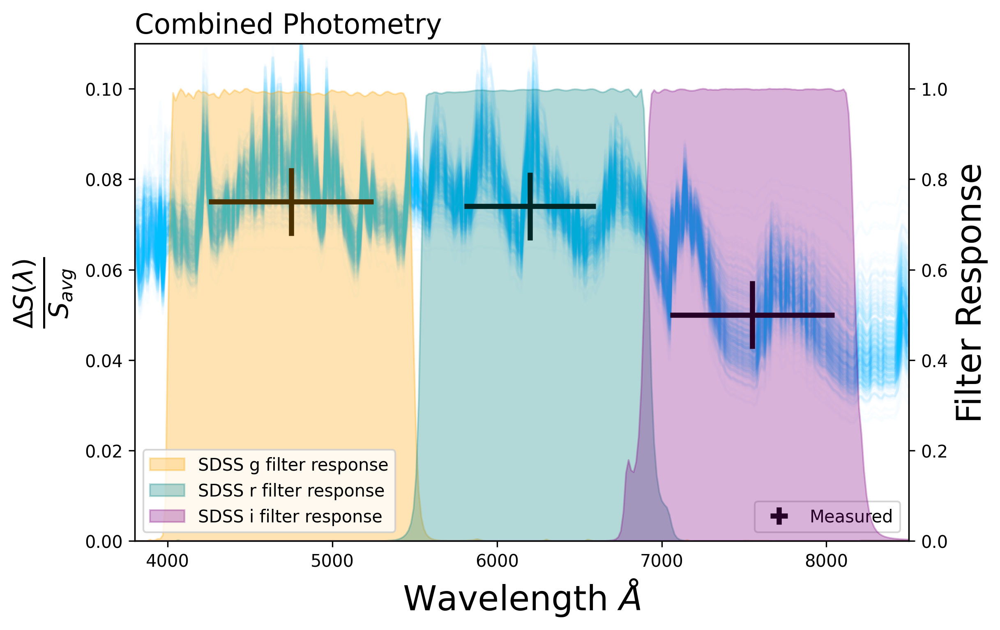

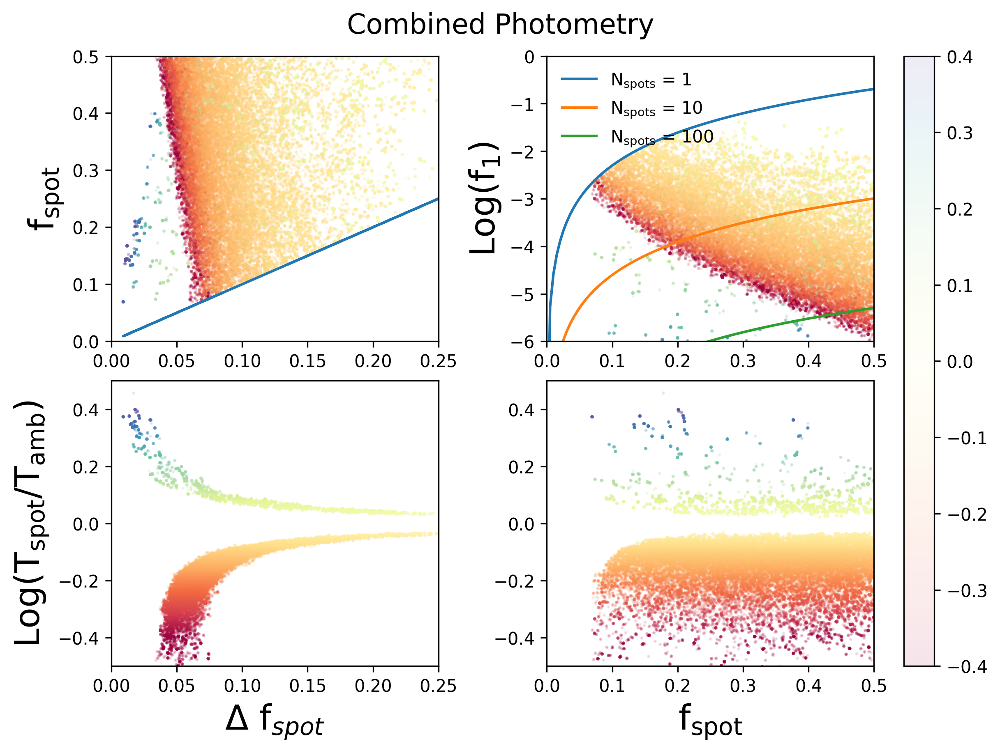

/Users/wiwa8630/opt/anaconda3/envs/the-lab/lib/python3.9/site-packages/corner/core.py:103: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.subplots_adjust(


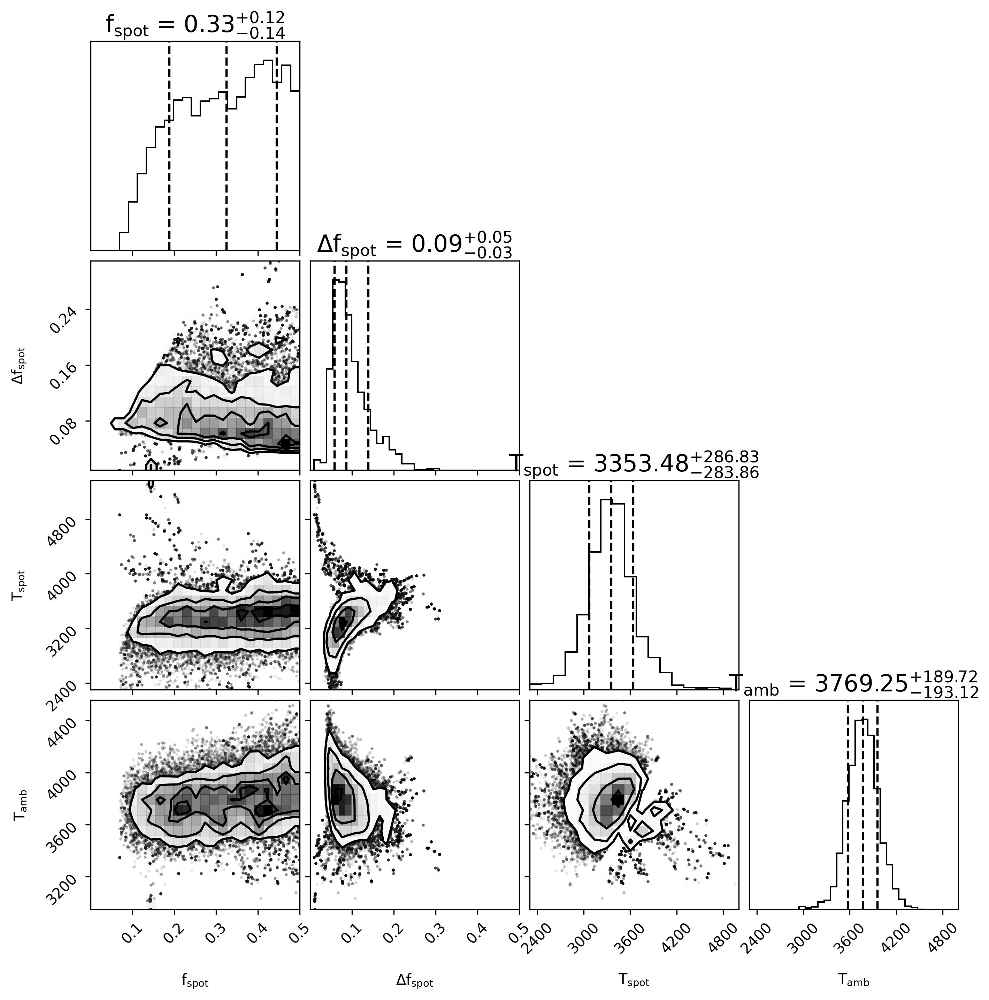

In [23]:
fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
# Define the 50th percentile and 1-sigma interval parameter values from the samples
best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
best_params_err_lower = best_params-[sig1_fspot[0], sig1_dfspot[0], sig1_Tspot[0], sig1_Tamb[0]]
best_params_err_higher = [sig1_fspot[2], sig1_dfspot[2], sig1_Tspot[2], sig1_Tamb[2]]-best_params
variable_names = [r'f$_{\rm{spot}}$',r'$\Delta$f$_{\rm{spot}}$',r'T$_{\rm{spot}}$',r'T$_{\rm{amb}}$']
normie_names = ['fspot','dfspot','Tspot','Tamb'] 

plot_variability_model(parameters=best_params,
                              plot=True,samples_exist=True,
                              samples=samples)

# Plot samples
fig, axs = plt.subplots(2,2,figsize=(8,6))
title_label=f'Combined Photometry'
fig.suptitle(title_label,fontsize=16)
ax1 = axs[0,0]
ax2 = axs[1,0]
ax3 = axs[0,1]
ax4 = axs[1,1]
colmap = 'Spectral'
# plot dfspot vs fspot
ax1.scatter(dfspot_sam,fspot_sam,c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax1.plot(dfspot_sam,dfspot_sam)
ax1.set_ylabel(r'f$_{\rm{spot}}$',fontsize=20)
ax1.set_ylim(0,0.5)
ax1.set_xlim(0,0.25)
# plot dfspot vs log(Tspot/Tamb)
ax2.scatter(dfspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax2.set_xlabel(r'$\Delta$ f$_{spot}$',fontsize=20)
ax2.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)
ax2.set_xlim(0,0.25)
ax2.set_ylim(-.5,0.5)
# plot fspot vs log(f1), the filling factor of 1 spot
top_right_plot = ax3.scatter(fspot_sam,np.log(dfspot_sam**2/fspot_sam),
                                c=np.log(Tspot_sam/Tamb_sam),cmap=colmap,
                                alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)),label=r'N$_{\rm{spots}}$ = 1')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/10),label=r'N$_{\rm{spots}}$ = 10')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/100),label=r'N$_{\rm{spots}}$ = 100')
ax3.set_xlim(0,0.5)
ax3.set_ylim(-6,0)
ax3.set_ylabel(r'Log(f$_1$)',fontsize=20)
ax3.legend(loc='upper left',frameon=False,fontsize='10')
fig.colorbar(top_right_plot, ax=axs[:, 1])
# plot fspot vs log(Tspot/Tamb)
ax4.scatter(fspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax4.set_ylim(-.5,0.5)
ax4.set_xlim(0,0.5)
ax4.set_xlabel(r'f$_{\rm{spot}}$',fontsize=20)
# ax4.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)

# plt.savefig(f'../figs/{visit}_{order}_{modeltype}_samples.png',dpi=200)
plt.show()
plt.close()

#make the corner plot
figure = corner.corner(samples.T, labels=variable_names,
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 16})

# Extract the axes, loop through to set all the limits
axes = np.array(figure.axes).reshape((4, 4))
for yi in range(4):
    ax = axes[yi, 0]
    ax.set_xlim(0,0.5)
    ax = axes[yi, 1]
    ax.set_xlim(0,0.5)
    ax = axes[yi, 2]
    ax.set_xlim(2300,5000)
    ax = axes[yi, 3]
    ax.set_xlim(2300,5000)
# plt.savefig(f'../figs/{label}_corner.png',dpi=200)
plt.show()
plt.close()

## Run Teff + Spec Model

In [27]:
now = datetime.datetime.now()
print(now)

do_Teff = True
do_CombinedSpec=True
do_Combined_Photometry=False
nsteps=2000

# Run the MCMC
print('beginning MCMC..')
samples = do_mcmc(label = 'Combined_Teff_Spec_2000steps',
                  nsteps = nsteps, burnin = int(0.25*nsteps))

now = datetime.datetime.now()
print(now)

2023-06-26 17:38:32.150240
beginning MCMC..
(Nsteps-burnin)*nwalkers/tau= [441.19963668]
(Nsteps-burnin)*nwalkers/tau= [1216.19497677]
(Nsteps-burnin)*nwalkers/tau= [126.30623384]
(Nsteps-burnin)*nwalkers/tau= [167.53997504]
2023-06-26 23:36:20.452592


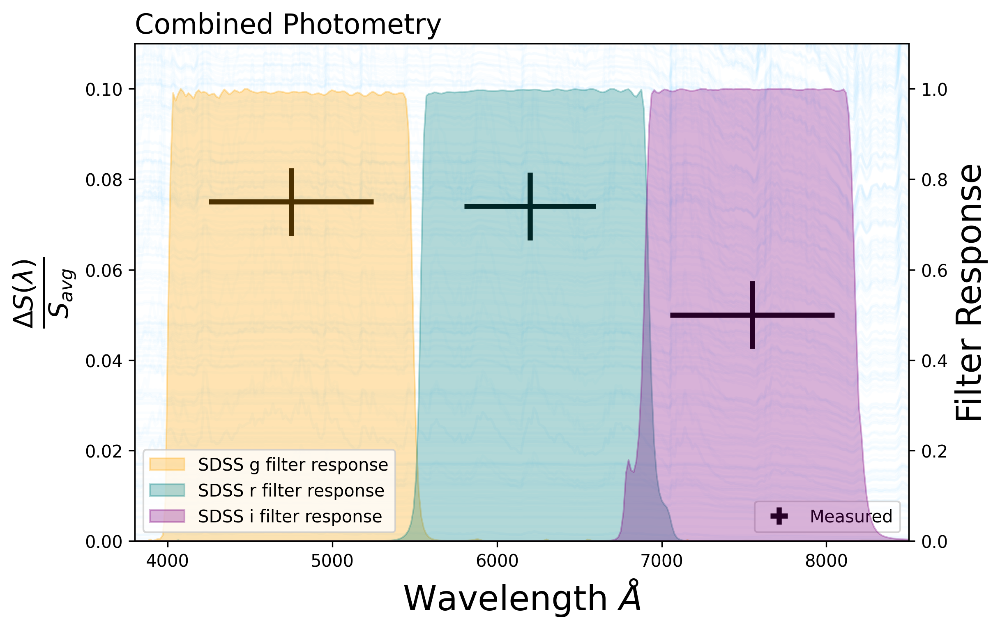

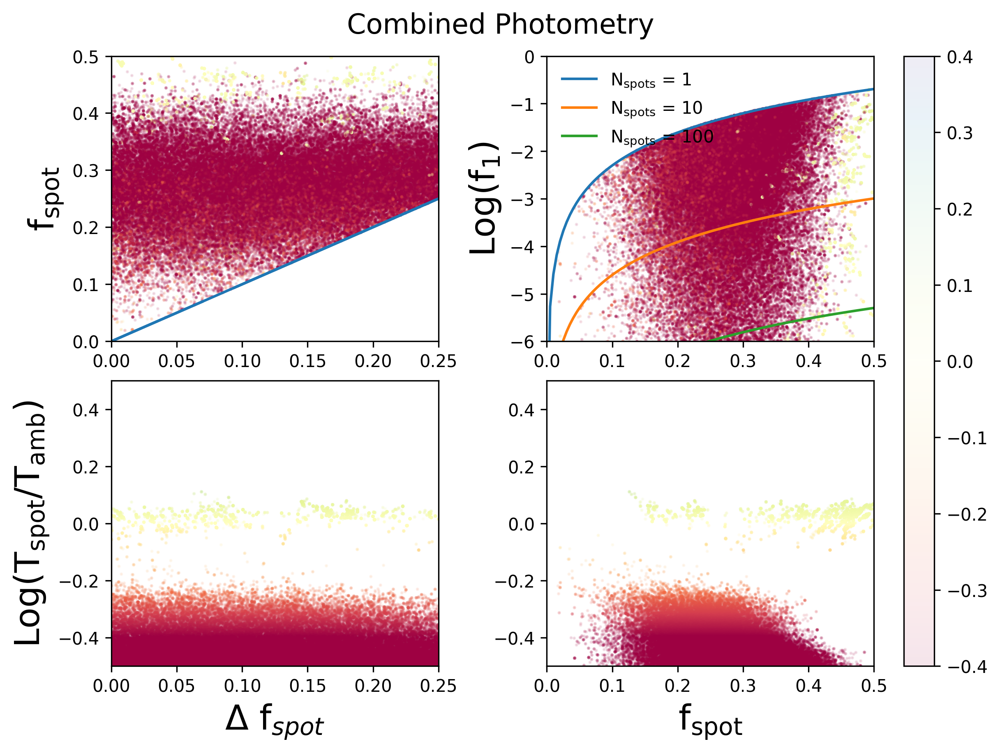

/Users/wiwa8630/opt/anaconda3/envs/the-lab/lib/python3.9/site-packages/corner/core.py:103: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  fig.subplots_adjust(


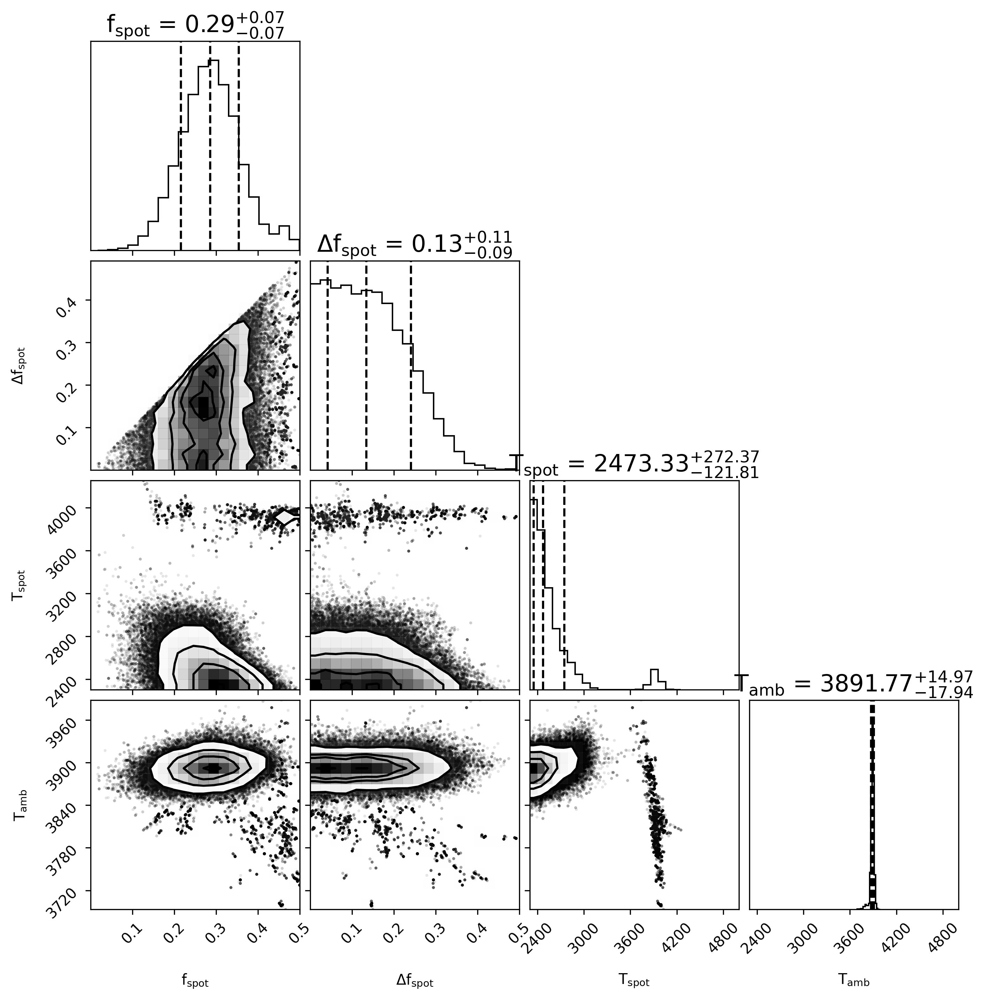

In [28]:
fspot_sam, dfspot_sam, Tspot_sam, Tamb_sam = samples
sig1_fspot = np.percentile(fspot_sam, [15.9, 50., 84.1]) # central 1-sigma values
sig1_dfspot = np.percentile(dfspot_sam, [15.9, 50., 84.1])
sig1_Tspot = np.percentile(Tspot_sam, [15.9, 50., 84.1])
sig1_Tamb = np.percentile(Tamb_sam, [15.9, 50., 84.1])
# Define the 50th percentile and 1-sigma interval parameter values from the samples
best_params = np.array([sig1_fspot[1], sig1_dfspot[1], sig1_Tspot[1], sig1_Tamb[1]])
best_params_err_lower = best_params-[sig1_fspot[0], sig1_dfspot[0], sig1_Tspot[0], sig1_Tamb[0]]
best_params_err_higher = [sig1_fspot[2], sig1_dfspot[2], sig1_Tspot[2], sig1_Tamb[2]]-best_params
variable_names = [r'f$_{\rm{spot}}$',r'$\Delta$f$_{\rm{spot}}$',r'T$_{\rm{spot}}$',r'T$_{\rm{amb}}$']
normie_names = ['fspot','dfspot','Tspot','Tamb'] 

plot_variability_model(parameters=best_params,
                              plot=True,samples_exist=True,
                              samples=samples)

# Plot samples
fig, axs = plt.subplots(2,2,figsize=(8,6))
title_label=f'Combined Photometry'
fig.suptitle(title_label,fontsize=16)
ax1 = axs[0,0]
ax2 = axs[1,0]
ax3 = axs[0,1]
ax4 = axs[1,1]
colmap = 'Spectral'
# plot dfspot vs fspot
ax1.scatter(dfspot_sam,fspot_sam,c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax1.plot(dfspot_sam,dfspot_sam)
ax1.set_ylabel(r'f$_{\rm{spot}}$',fontsize=20)
ax1.set_ylim(0,0.5)
ax1.set_xlim(0,0.25)
# plot dfspot vs log(Tspot/Tamb)
ax2.scatter(dfspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax2.set_xlabel(r'$\Delta$ f$_{spot}$',fontsize=20)
ax2.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)
ax2.set_xlim(0,0.25)
ax2.set_ylim(-.5,0.5)
# plot fspot vs log(f1), the filling factor of 1 spot
top_right_plot = ax3.scatter(fspot_sam,np.log(dfspot_sam**2/fspot_sam),
                                c=np.log(Tspot_sam/Tamb_sam),cmap=colmap,
                                alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)),label=r'N$_{\rm{spots}}$ = 1')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/10),label=r'N$_{\rm{spots}}$ = 10')
ax3.plot(np.linspace(0,0.5,100),np.log(np.linspace(0.0001,0.5,100)/100),label=r'N$_{\rm{spots}}$ = 100')
ax3.set_xlim(0,0.5)
ax3.set_ylim(-6,0)
ax3.set_ylabel(r'Log(f$_1$)',fontsize=20)
ax3.legend(loc='upper left',frameon=False,fontsize='10')
fig.colorbar(top_right_plot, ax=axs[:, 1])
# plot fspot vs log(Tspot/Tamb)
ax4.scatter(fspot_sam,np.log(Tspot_sam/Tamb_sam),c=np.log(Tspot_sam/Tamb_sam),
            cmap=colmap,alpha=0.1,edgecolor=None,vmin=-0.4,vmax=0.4,s=1)
ax4.set_ylim(-.5,0.5)
ax4.set_xlim(0,0.5)
ax4.set_xlabel(r'f$_{\rm{spot}}$',fontsize=20)
# ax4.set_ylabel(r'Log(T$_{\rm{spot}}$/T$_{\rm{amb}}$)',fontsize=20)

# plt.savefig(f'../figs/{visit}_{order}_{modeltype}_samples.png',dpi=200)
plt.show()
plt.close()

#make the corner plot
figure = corner.corner(samples.T, labels=variable_names,
                       quantiles=[0.16, 0.5, 0.84],
                       show_titles=True, title_kwargs={"fontsize": 16})

# Extract the axes, loop through to set all the limits
axes = np.array(figure.axes).reshape((4, 4))
for yi in range(4):
    ax = axes[yi, 0]
    ax.set_xlim(0,0.5)
    ax = axes[yi, 1]
    ax.set_xlim(0,0.5)
    ax = axes[yi, 2]
    ax.set_xlim(2300,5000)
    ax = axes[yi, 3]
    ax.set_xlim(2300,5000)
# plt.savefig(f'../figs/{label}_corner.png',dpi=200)
plt.show()
plt.close()

In [ ]:
# Also need to plot spectral models and the PDFs like I did before

## Run Teff + Photometry + Spectra Model

In [ ]:
do_Teff = True
do_CombinedSpec=True
do_Combined_Photometry=True
nsteps=2000

# Run the MCMC
print('beginning MCMC..')
samples = do_mcmc(label = 'Combined_Teff_Phot_Spec_2000steps',
                  nsteps = nsteps, burnin = int(0.25*nsteps))

beginning MCMC..
